In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as pe
plt.rcParams['figure.figsize'] = (8, 5)
plt.rcParams['figure.dpi'] = 250
%matplotlib inline
import warnings
warnings.filterwarnings(action= 'ignore')

In [2]:
# 1. Perform EDA, Visualizations & Summary stats, Data Preprocessing
# 2. Splitting Data
# 3. Build 3 Multiple Linear Regression Models
# 4. Evaluate Models

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/PrathameshR10/Assignments/main/Folder/MLR%20Dataset.csv')
df

,Price,Age_08_04,KM,Fuel_Type,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
0,13500,23,46986,Diesel,90,0,2000,3,4,5,1165
1,13750,23,72937,Diesel,90,0,2000,3,4,5,1165
2,13950,24,41711,Diesel,90,0,2000,3,4,5,1165
3,14950,26,48000,Diesel,90,0,2000,3,4,5,1165
4,13750,30,38500,Diesel,90,0,2000,3,4,5,1170
...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,Petrol,86,0,1300,3,4,5,1025
1432,10845,72,19000,Petrol,86,0,1300,3,4,5,1015
1433,8500,71,17016,Petrol,86,0,1300,3,4,5,1015
1434,7250,70,16916,Petrol,86,0,1300,3,4,5,1015


## 1.EDA

In [4]:
df.describe()

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.00000,1436.000000,1436.0,1436.000000,1436.00000
mean,10730.824513,55.947075,68533.259749,101.502089,0.055710,1576.85585,4.033426,4.0,5.026462,1072.45961
std,3626.964585,18.599988,37506.448872,14.981080,0.229441,424.38677,0.952677,0.0,0.188510,52.64112
min,4350.000000,1.000000,1.000000,69.000000,0.000000,1300.00000,2.000000,4.0,3.000000,1000.00000
25%,8450.000000,44.000000,43000.000000,90.000000,0.000000,1400.00000,3.000000,4.0,5.000000,1040.00000
50%,9900.000000,61.000000,63389.500000,110.000000,0.000000,1600.00000,4.000000,4.0,5.000000,1070.00000
75%,11950.000000,70.000000,87020.750000,110.000000,0.000000,1600.00000,5.000000,4.0,5.000000,1085.00000
max,32500.000000,80.000000,243000.000000,192.000000,1.000000,16000.00000,5.000000,4.0,6.000000,1615.00000


In [5]:
df.drop(columns='Cylinders',inplace=True)        # Variance in cylinders column is 0, thus won't provide any value in model
df

,Price,Age_08_04,KM,Fuel_Type,HP,Automatic,cc,Doors,Gears,Weight
0,13500,23,46986,Diesel,90,0,2000,3,5,1165
1,13750,23,72937,Diesel,90,0,2000,3,5,1165
2,13950,24,41711,Diesel,90,0,2000,3,5,1165
3,14950,26,48000,Diesel,90,0,2000,3,5,1165
4,13750,30,38500,Diesel,90,0,2000,3,5,1170
...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,Petrol,86,0,1300,3,5,1025
1432,10845,72,19000,Petrol,86,0,1300,3,5,1015
1433,8500,71,17016,Petrol,86,0,1300,3,5,1015
1434,7250,70,16916,Petrol,86,0,1300,3,5,1015


In [6]:
df.describe(include= object)

,Fuel_Type
count,1436
unique,3
top,Petrol
freq,1264


In [7]:
df.rename(columns={'Age_08_04':'Age'},inplace=True)

#### Missing Values

In [8]:
df.isna().sum()       # No null values

Price        0
Age          0
KM           0
Fuel_Type    0
HP           0
Automatic    0
cc           0
Doors        0
Gears        0
Weight       0
dtype: int64

#### Data Inconsistency

In [9]:
df.info()           # No Inconsistencies in dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1436 entries, 0 to 1435
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Price      1436 non-null   int64 
 1   Age        1436 non-null   int64 
 2   KM         1436 non-null   int64 
 3   Fuel_Type  1436 non-null   object
 4   HP         1436 non-null   int64 
 5   Automatic  1436 non-null   int64 
 6   cc         1436 non-null   int64 
 7   Doors      1436 non-null   int64 
 8   Gears      1436 non-null   int64 
 9   Weight     1436 non-null   int64 
dtypes: int64(9), object(1)
memory usage: 112.3+ KB


#### Duplicate Values

In [10]:
df[df.duplicated(keep=False)]          # Presence of duplicate values

,Price,Age,KM,Fuel_Type,HP,Automatic,cc,Doors,Gears,Weight
112,24950,8,13253,Diesel,116,0,2000,5,5,1320
113,24950,8,13253,Diesel,116,0,2000,5,5,1320


In [11]:
df.drop_duplicates(inplace=True)

In [12]:
df.duplicated().sum()

0

In [13]:
df.shape

(1435, 10)

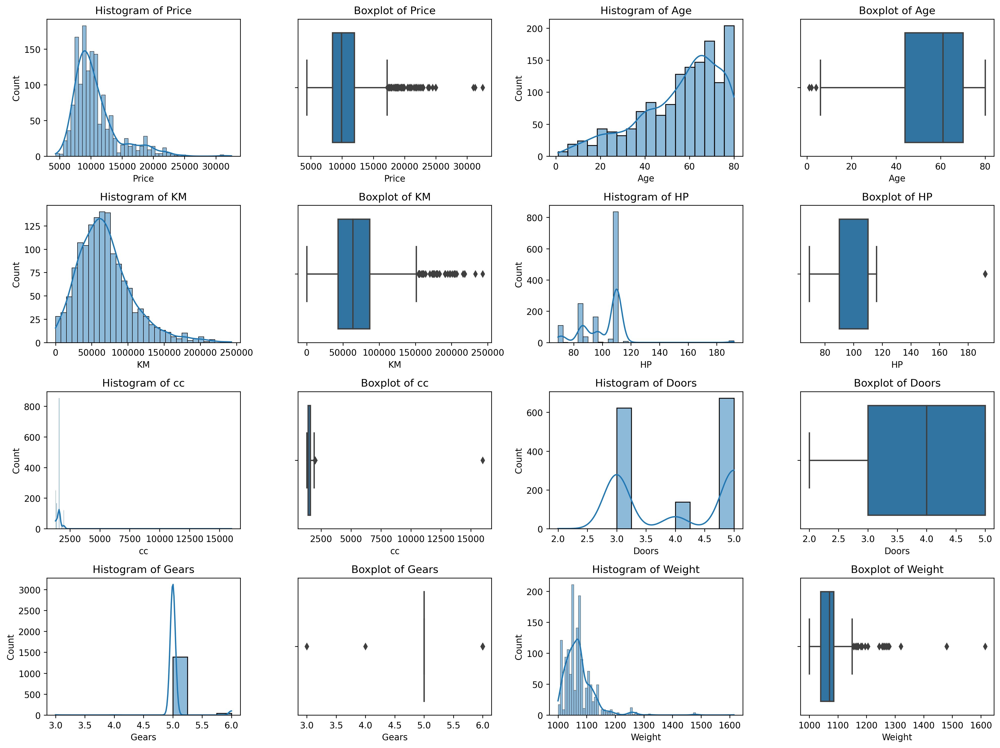

In [14]:
numerical_features = ['Price', 'Age', 'KM', 'HP', 'cc', 'Doors', 'Gears', 'Weight']

plt.figure(figsize=(16, 12))

for i, feature in enumerate(numerical_features):
    plt.subplot(4, 4, 2*i+1)
    sns.histplot(df[feature], kde=True)
    plt.title(f'Histogram of {feature}')

    plt.subplot(4, 4, 2*i+2)
    sns.boxplot(x=df[feature])
    plt.title(f'Boxplot of {feature}')

plt.tight_layout()
plt.show()

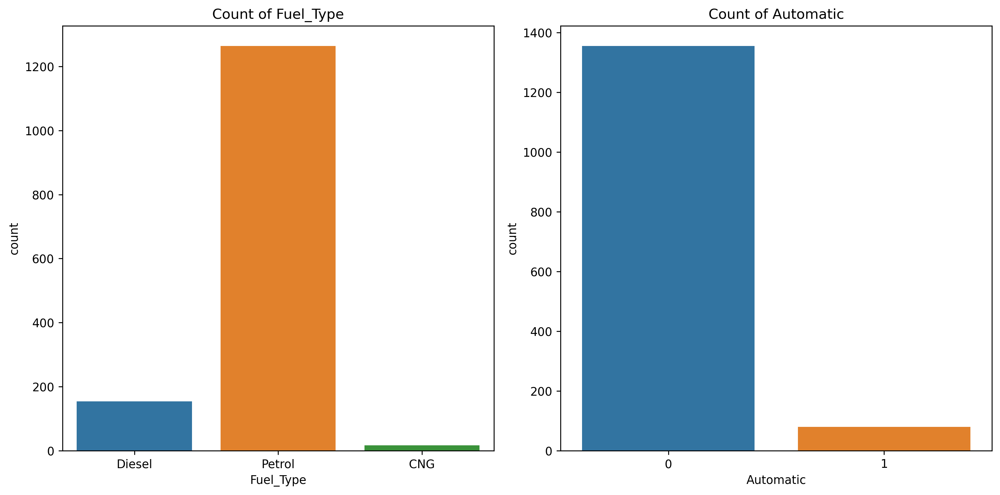

In [15]:
categorical_features = ['Fuel_Type', 'Automatic']

plt.figure(figsize=(12, 6))

for i, feature in enumerate(categorical_features):
    plt.subplot(1, 2, i+1)
    sns.countplot(x=df[feature])
    plt.title(f'Count of {feature}')

plt.tight_layout()

### Data Cleaning

In [16]:
df.skew()

Price         1.696579
Age          -0.825567
KM            1.017023
HP            0.957833
Automatic     3.876590
cc           27.452196
Doors        -0.075056
Gears         2.282921
Weight        3.116518
dtype: float64

<Axes: >

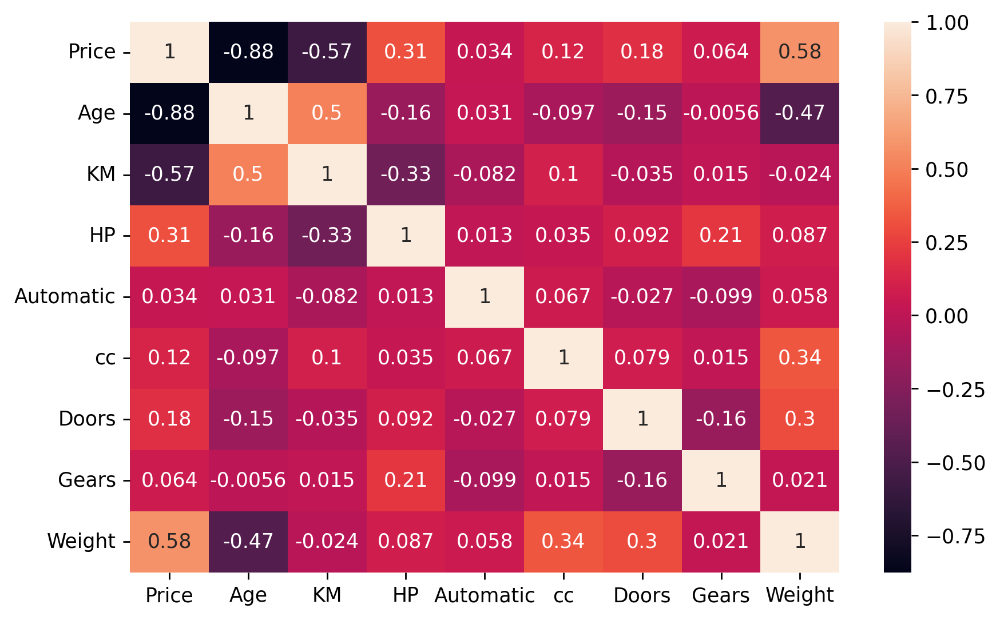

In [17]:
sns.heatmap(df.corr(),annot=True)

In [18]:
df.describe()

,Price,Age,KM,HP,Automatic,cc,Doors,Gears,Weight
count,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000
mean,10720.915679,55.980488,68571.782578,101.491986,0.055749,1576.560976,4.032753,5.026481,1072.287108
std,3608.732978,18.563312,37491.094553,14.981408,0.229517,424.387533,0.952667,0.188575,52.251882
min,4350.000000,1.000000,1.000000,69.000000,0.000000,1300.000000,2.000000,3.000000,1000.000000
25%,8450.000000,44.000000,43000.000000,90.000000,0.000000,1400.000000,3.000000,5.000000,1040.000000
50%,9900.000000,61.000000,63451.000000,110.000000,0.000000,1600.000000,4.000000,5.000000,1070.000000
75%,11950.000000,70.000000,87041.500000,110.000000,0.000000,1600.000000,5.000000,5.000000,1085.000000
max,32500.000000,80.000000,243000.000000,192.000000,1.000000,16000.000000,5.000000,6.000000,1615.000000


<Axes: >

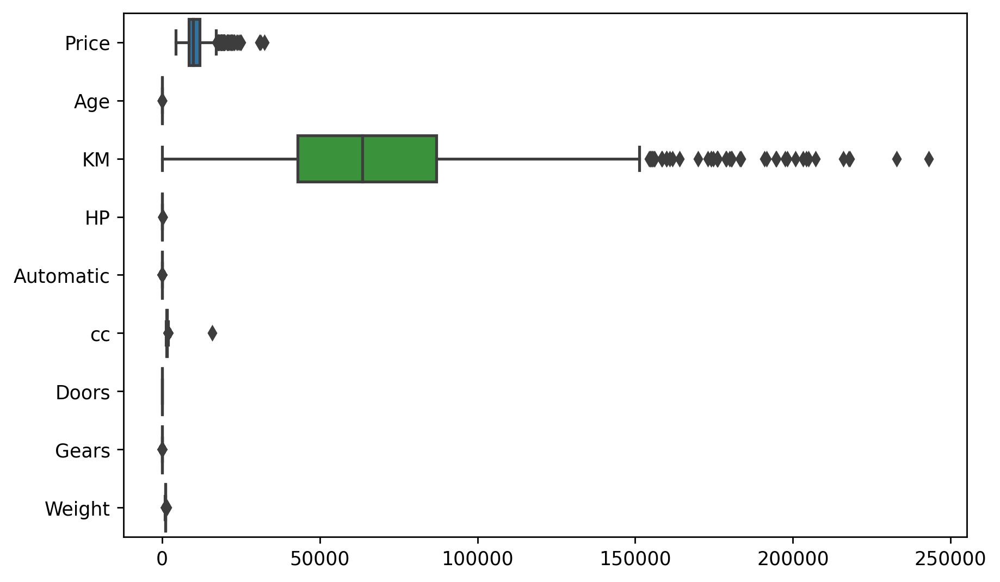

In [19]:
sns.boxplot(df, orient='h')

In [20]:
# Apart from Doors column, all columns have outliers
# cc Column has very high value out of logical range, so lets start with cc.

In [21]:
df['cc'].max()

16000

In [22]:
df[df['cc'] == 16000]

,Price,Age,KM,Fuel_Type,HP,Automatic,cc,Doors,Gears,Weight
80,18950,25,20019,Petrol,110,1,16000,5,5,1180


In [23]:
df['cc'].unique()     # All the values except above are below 2000

array([ 2000,  1800,  1900,  1600,  1400,  1598, 16000,  1995,  1398,
        1300,  1587,  1975,  1332], dtype=int64)

In [24]:
pe.box(df['cc'])

In [25]:
df['Weight'].unique()

array([1165, 1170, 1245, 1185, 1105, 1065, 1120, 1100, 1255, 1270, 1110,
       1195, 1180, 1075, 1130, 1275, 1060, 1115, 1265, 1260, 1125, 1155,
       1045, 1480, 1320, 1280, 1135, 1090, 1150, 1085, 1160, 1205, 1084,
       1140, 1095, 1025, 1119, 1080, 1121, 1615, 1067, 1040, 1030, 1055,
       1050, 1103, 1070, 1035, 1015, 1000, 1078, 1079, 1109, 1020, 1010,
       1114, 1172, 1094, 1083], dtype=int64)

In [26]:
pe.box(df['Weight'])

In [27]:
df['Gears'].value_counts()

5    1389
6      43
3       2
4       1
Name: Gears, dtype: int64

In [28]:
pe.box(df[['Gears','Weight','Automatic','cc']],orientation='h')

In [29]:
# We can use capping method on columns like cc,automatic,gears and weight to treat outliers.
def outlier_capping(data, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 -Q1
    
    lower_cap = Q1 - 1.5 * IQR
    upper_cap = Q3 + 1.5 * IQR
    
    df[columns] = df[columns].clip(lower=lower_cap, upper=upper_cap, axis = 1)
    return df

cap_columns = ['cc','Weight','Automatic','Gears','Age']
cap_df = outlier_capping(df, cap_columns)

In [30]:
df.skew()

Price        1.696579
Age         -0.816526
KM           1.017023
HP           0.957833
Automatic    0.000000
cc           0.198127
Doors       -0.075056
Gears        0.000000
Weight       0.516901
dtype: float64

In [31]:
df.describe()

,Price,Age,KM,HP,Automatic,cc,Doors,Gears,Weight
count,1435.000000,1435.000000,1435.000000,1435.000000,1435.0,1435.000000,1435.000000,1435.0,1435.000000
mean,10720.915679,55.992334,68571.782578,101.491986,0.0,1558.327526,4.032753,5.0,1068.520906
std,3608.732978,18.529725,37491.094553,14.981408,0.0,168.788311,0.952667,0.0,37.722708
min,4350.000000,5.000000,1.000000,69.000000,0.0,1300.000000,2.000000,5.0,1000.000000
25%,8450.000000,44.000000,43000.000000,90.000000,0.0,1400.000000,3.000000,5.0,1040.000000
50%,9900.000000,61.000000,63451.000000,110.000000,0.0,1600.000000,4.000000,5.0,1070.000000
75%,11950.000000,70.000000,87041.500000,110.000000,0.0,1600.000000,5.000000,5.0,1085.000000
max,32500.000000,80.000000,243000.000000,192.000000,0.0,1900.000000,5.000000,5.0,1152.500000


In [32]:
# After using capping method, skewness of columns automatic and gears came down to zero.
# Automatic column had std deviation close to zero and max value was 1
# Gears column had mean close to 5 which is currently value and had only few outlier data points
# Currently these columns will not add any value to our model, so we can drop these columns

In [33]:
df.drop(columns=df[['Automatic','Gears']],inplace=True)

In [34]:
df.describe()

,Price,Age,KM,HP,cc,Doors,Weight
count,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000
mean,10720.915679,55.992334,68571.782578,101.491986,1558.327526,4.032753,1068.520906
std,3608.732978,18.529725,37491.094553,14.981408,168.788311,0.952667,37.722708
min,4350.000000,5.000000,1.000000,69.000000,1300.000000,2.000000,1000.000000
25%,8450.000000,44.000000,43000.000000,90.000000,1400.000000,3.000000,1040.000000
50%,9900.000000,61.000000,63451.000000,110.000000,1600.000000,4.000000,1070.000000
75%,11950.000000,70.000000,87041.500000,110.000000,1600.000000,5.000000,1085.000000
max,32500.000000,80.000000,243000.000000,192.000000,1900.000000,5.000000,1152.500000


In [35]:
df.skew()

Price     1.696579
Age      -0.816526
KM        1.017023
HP        0.957833
cc        0.198127
Doors    -0.075056
Weight    0.516901
dtype: float64

In [36]:
# Columns with high skewness are Price,KM, and HP.
# Log transformation method can be used on these data points as these columns

<Axes: >

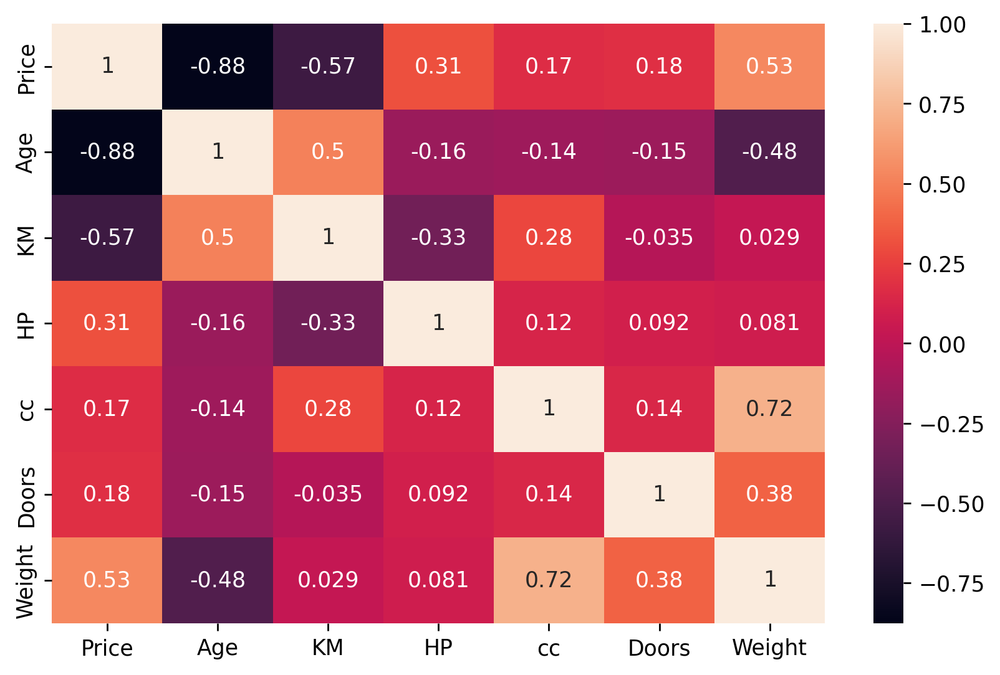

In [37]:
sns.heatmap(df.corr(),annot=True)

In [38]:
pe.box(df[['Price','HP','KM']],orientation='h')

In [39]:
df['HP'].unique()

array([ 90, 192,  69, 110,  97,  71, 116,  98,  86,  72, 107,  73],
      dtype=int64)

In [40]:
pe.box(df['HP'])

In [41]:
df['HP'].value_counts()

110    835
86     249
97     164
72      73
90      36
69      34
107     21
192     11
116      8
98       2
71       1
73       1
Name: HP, dtype: int64

In [42]:
df[df['HP'] < 192].Price.agg({'min','max'})

max    32500
min     4350
Name: Price, dtype: int64

In [43]:
df[df['HP'] == 192].Price.agg({'min','max'})

max    23950
min    19600
Name: Price, dtype: int64

In [44]:
pe.scatter(x = df['HP'], y =df['Price'])

In [45]:
# Log Transformation
df['Price_log'] = np.log(df['Price'])

In [46]:
df

,Price,Age,KM,Fuel_Type,HP,cc,Doors,Weight,Price_log
0,13500,23,46986,Diesel,90,1900,3,1152.5,9.510445
1,13750,23,72937,Diesel,90,1900,3,1152.5,9.528794
2,13950,24,41711,Diesel,90,1900,3,1152.5,9.543235
3,14950,26,48000,Diesel,90,1900,3,1152.5,9.612467
4,13750,30,38500,Diesel,90,1900,3,1152.5,9.528794
...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,Petrol,86,1300,3,1025.0,8.922658
1432,10845,72,19000,Petrol,86,1300,3,1015.0,9.291459
1433,8500,71,17016,Petrol,86,1300,3,1015.0,9.047821
1434,7250,70,16916,Petrol,86,1300,3,1015.0,8.888757


In [47]:
df.skew()

Price        1.696579
Age         -0.816526
KM           1.017023
HP           0.957833
cc           0.198127
Doors       -0.075056
Weight       0.516901
Price_log    0.728086
dtype: float64

<Axes: >

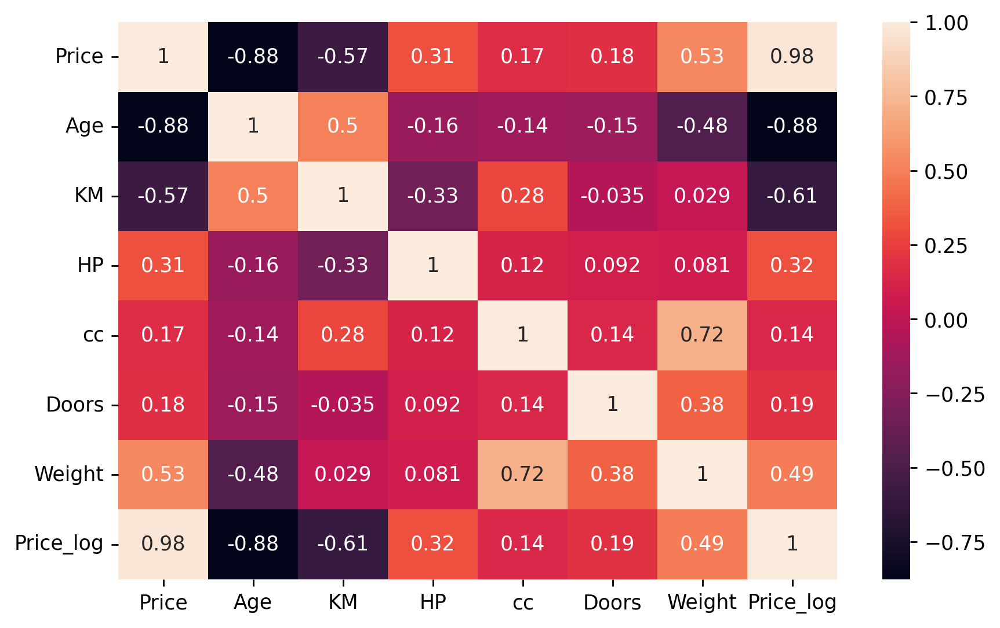

In [48]:
sns.heatmap(df.corr(),annot=True)

In [49]:
pe.box(df[['Price','Price_log','KM','HP']])

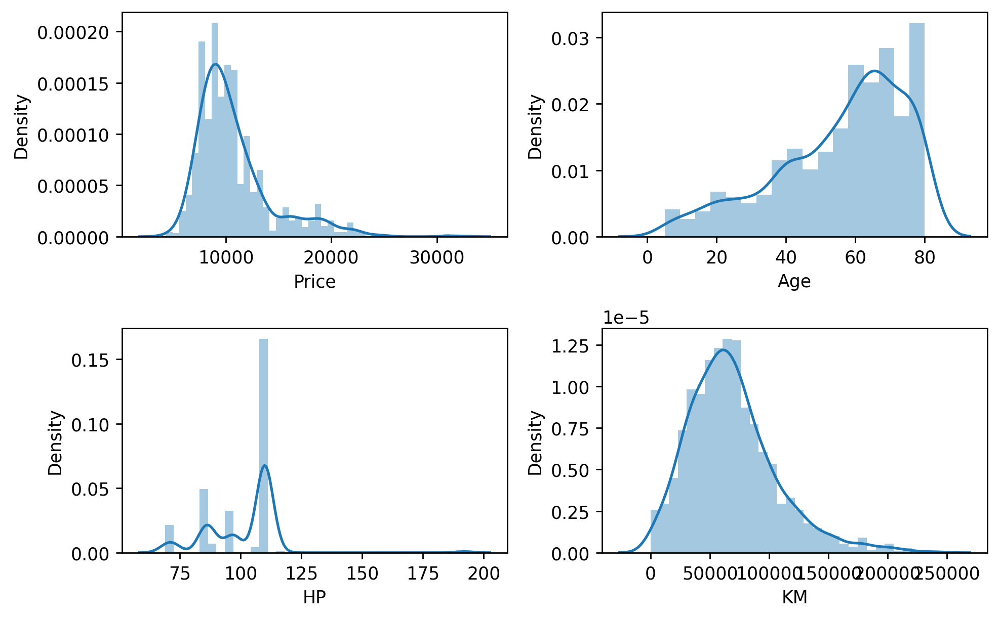

In [50]:
plt.subplot(2,2,1)
sns.distplot(df['Price'])

plt.subplot(2,2,2)
sns.distplot(df['Age'])

plt.subplot(2,2,3)
sns.distplot(df['HP'])

plt.subplot(2,2,4)
sns.distplot(df['KM'])

plt.tight_layout()

In [51]:
df['HP_log'] = np.log(df['HP'])
df.skew()

Price        1.696579
Age         -0.816526
KM           1.017023
HP           0.957833
cc           0.198127
Doors       -0.075056
Weight       0.516901
Price_log    0.728086
HP_log      -0.400072
dtype: float64

In [52]:
# Skewness of Price and HP column have reduced, but KM column still has high skewness
# We will try sqrt transformation on KM data

In [53]:
df['KM_sqrt'] = np.sqrt(df['KM'])
df.skew()

Price        1.696579
Age         -0.816526
KM           1.017023
HP           0.957833
cc           0.198127
Doors       -0.075056
Weight       0.516901
Price_log    0.728086
HP_log      -0.400072
KM_sqrt     -0.112720
dtype: float64

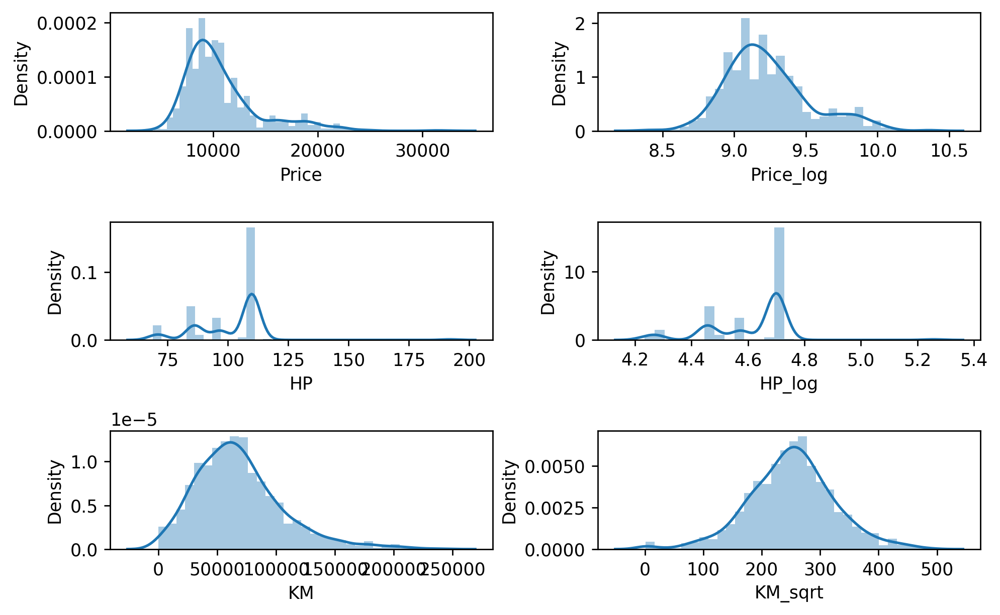

In [54]:
plt.subplot(3,2,1)
sns.distplot(df['Price'])

plt.subplot(3,2,2)
sns.distplot(df['Price_log'])

plt.subplot(3,2,3)
sns.distplot(df['HP'])

plt.subplot(3,2,4)
sns.distplot(df['HP_log'])

plt.subplot(3,2,5)
sns.distplot(df['KM'])

plt.subplot(3,2,6)
sns.distplot(df['KM_sqrt'])

plt.tight_layout()

In [55]:
# As skewness from HP, Price, KM column has reduced and new transformed columns have benn created, del previous columns

data = df.drop(columns=df[['Price','HP','KM']])
data

,Age,Fuel_Type,cc,Doors,Weight,Price_log,HP_log,KM_sqrt
0,23,Diesel,1900,3,1152.5,9.510445,4.499810,216.762543
1,23,Diesel,1900,3,1152.5,9.528794,4.499810,270.068510
2,24,Diesel,1900,3,1152.5,9.543235,4.499810,204.232710
3,26,Diesel,1900,3,1152.5,9.612467,4.499810,219.089023
4,30,Diesel,1900,3,1152.5,9.528794,4.499810,196.214169
...,...,...,...,...,...,...,...,...
1431,69,Petrol,1300,3,1025.0,8.922658,4.454347,143.331783
1432,72,Petrol,1300,3,1015.0,9.291459,4.454347,137.840488
1433,71,Petrol,1300,3,1015.0,9.047821,4.454347,130.445391
1434,70,Petrol,1300,3,1015.0,8.888757,4.454347,130.061524


In [56]:
data = data[['Price_log','Age','KM_sqrt','HP_log','cc','Doors','Weight','Fuel_Type']]
data

,Price_log,Age,KM_sqrt,HP_log,cc,Doors,Weight,Fuel_Type
0,9.510445,23,216.762543,4.499810,1900,3,1152.5,Diesel
1,9.528794,23,270.068510,4.499810,1900,3,1152.5,Diesel
2,9.543235,24,204.232710,4.499810,1900,3,1152.5,Diesel
3,9.612467,26,219.089023,4.499810,1900,3,1152.5,Diesel
4,9.528794,30,196.214169,4.499810,1900,3,1152.5,Diesel
...,...,...,...,...,...,...,...,...
1431,8.922658,69,143.331783,4.454347,1300,3,1025.0,Petrol
1432,9.291459,72,137.840488,4.454347,1300,3,1015.0,Petrol
1433,9.047821,71,130.445391,4.454347,1300,3,1015.0,Petrol
1434,8.888757,70,130.061524,4.454347,1300,3,1015.0,Petrol


In [57]:
data.describe()

,Price_log,Age,KM_sqrt,HP_log,cc,Doors,Weight
count,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000
mean,9.233079,55.992334,251.311052,4.609163,1558.327526,4.032753,1068.520906
std,0.295393,18.529725,73.609196,0.148229,168.788311,0.952667,37.722708
min,8.377931,5.000000,1.000000,4.234107,1300.000000,2.000000,1000.000000
25%,9.041922,44.000000,207.364414,4.499810,1400.000000,3.000000,1040.000000
50%,9.200290,61.000000,251.894819,4.700480,1600.000000,4.000000,1070.000000
75%,9.388487,70.000000,295.027956,4.700480,1600.000000,5.000000,1085.000000
max,10.388995,80.000000,492.950302,5.257495,1900.000000,5.000000,1152.500000


<Axes: >

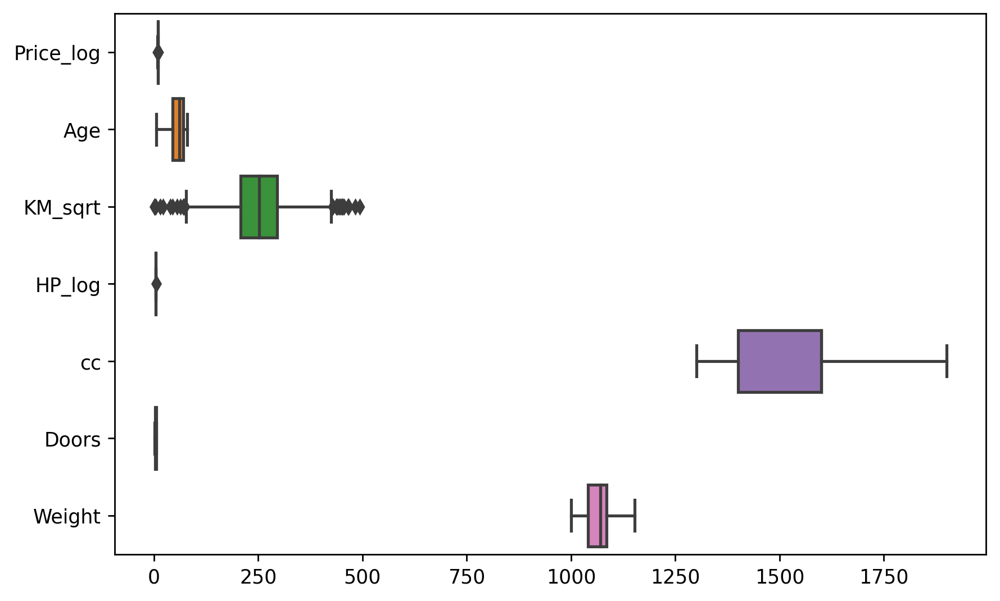

In [58]:
sns.boxplot(data, orient='h')

<Axes: >

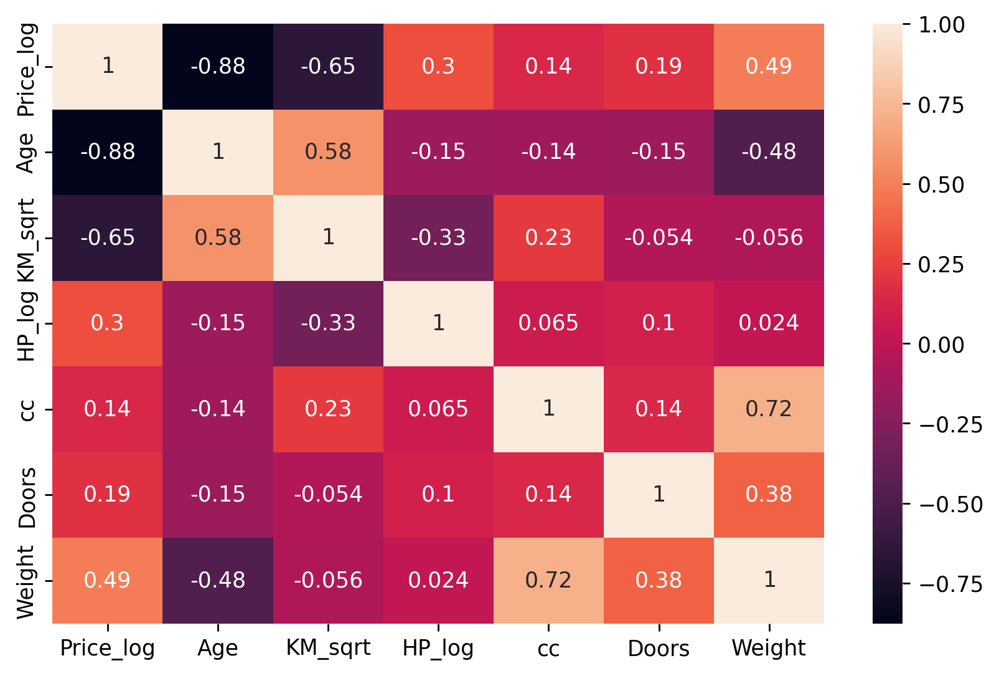

In [59]:
sns.heatmap(data.corr(), annot=True)

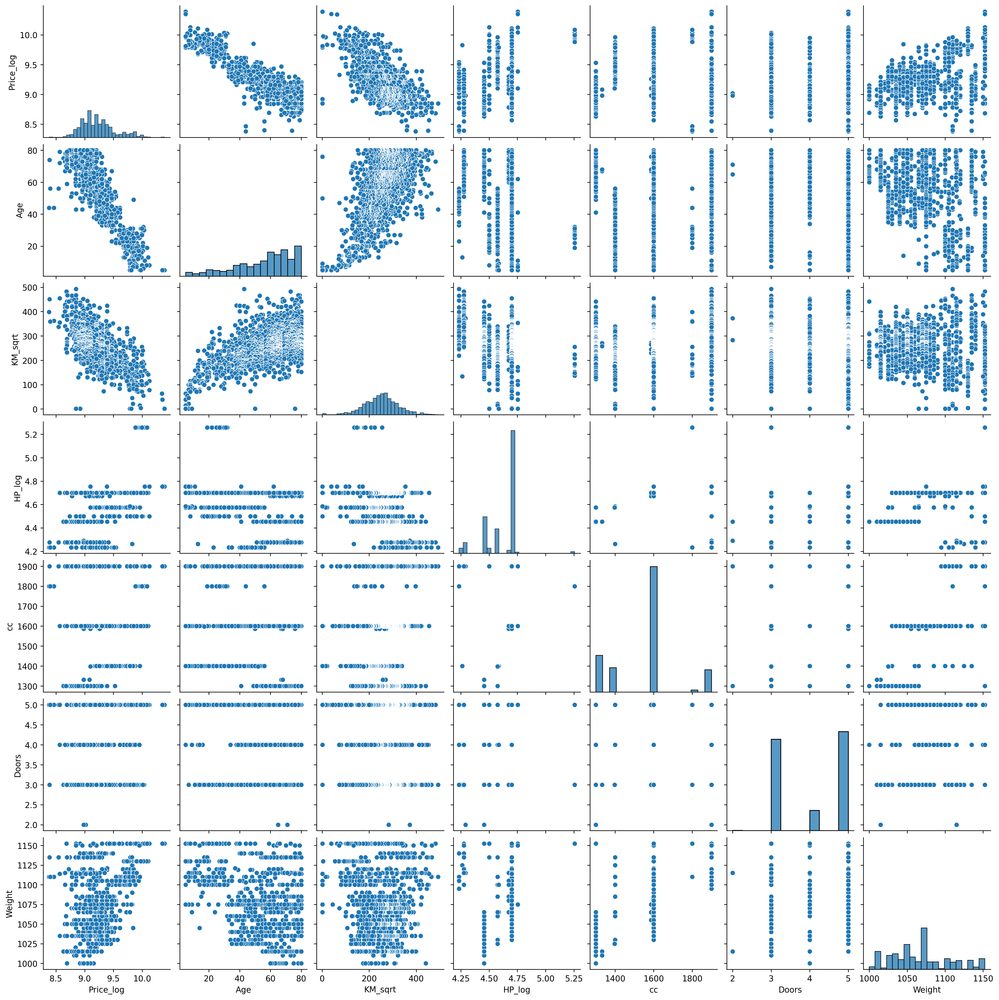

In [60]:
sns.pairplot(data)

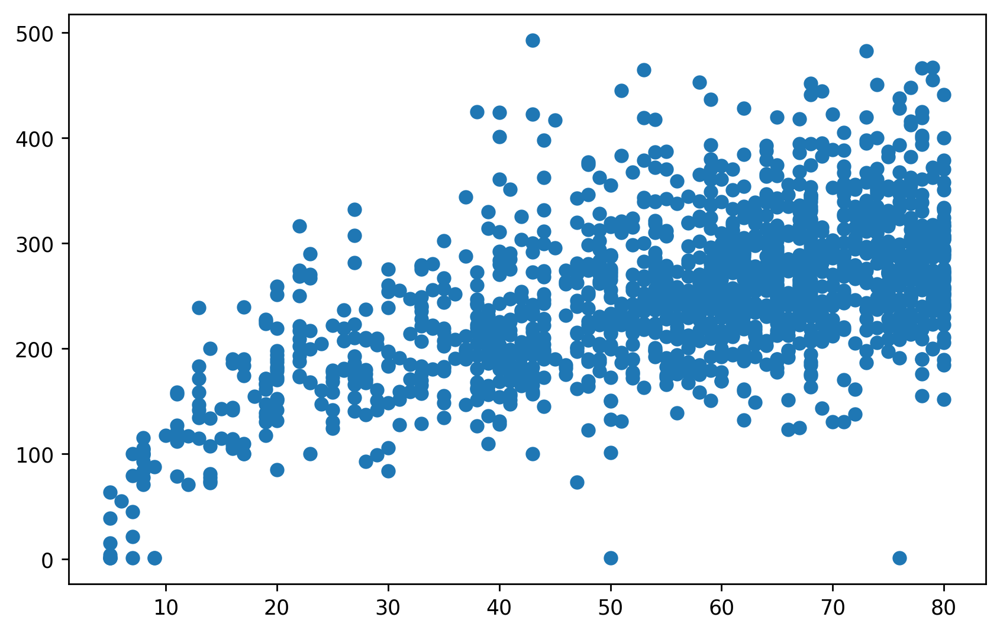

In [61]:
plt.scatter(data['Age'],data['KM_sqrt'])

## Splitting the Dataset & Model Building

### Model No. 1

In [62]:
# Except Categorical column we will use all the preprocessed columns to build model no.1 

In [63]:
# defining x1 & y1 for Model No.1
x1 = data.drop(columns=['Price_log','Fuel_Type'])    
y1 = data['Price_log']

In [64]:
data.shape

(1435, 8)

In [65]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(x1)

StandardScaler()

In [66]:
scaler_inputs = scaler.transform(x1)

In [67]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [68]:
x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.2, random_state=42)

In [69]:
x1_train

,Age,KM_sqrt,HP_log,cc,Doors,Weight
1128,78,330.549542,4.700480,1600,5,1070.0
899,62,243.505647,4.454347,1300,5,1035.0
1188,71,300.616034,4.454347,1300,5,1035.0
311,44,196.114762,4.700480,1600,5,1080.0
1145,75,319.147301,4.700480,1600,5,1070.0
...,...,...,...,...,...,...
1096,75,354.118624,4.700480,1600,3,1050.0
1131,75,327.108545,4.700480,1600,3,1050.0
1295,80,267.394839,4.700480,1600,4,1035.0
861,65,254.224310,4.700480,1600,5,1070.0


In [70]:
from sklearn.linear_model import LinearRegression

In [71]:
lg = LinearRegression()
lg.fit(x1_train,y1_train)

LinearRegression()

#### Train Dataset prediction

In [72]:
y1_hat = lg.predict(x1_train)         # y1_hat is variable for y values predicted based on x1 training dataset

In [73]:
pe.scatter(x = y1_hat, y = y1_train)

Text(0.5, 1.0, 'Residuals')

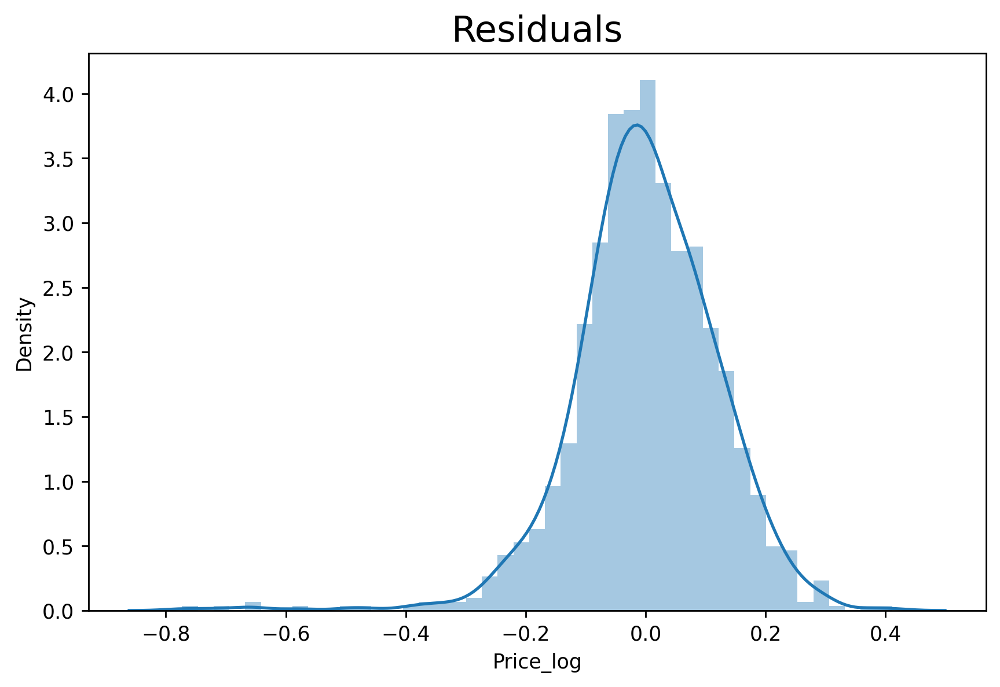

In [74]:
sns.distplot(y1_train - y1_hat)
plt.title('Residuals',size =18)

In [75]:
lg.score(x1_train,y1_train)

0.8380106521216839

In [76]:
# Longer left tail in residual plot shows that, some predictions are higher than original values
# i.e they are over estimating the target value

#### Test Dataset Prediction

In [77]:
y1_pred = lg.predict(x1_test)     #y1_pred is variable for predicted values based on x1_test data

In [78]:
pe.scatter(x = y1_test, y = y1_pred)

<Axes: xlabel='Price_log', ylabel='Density'>

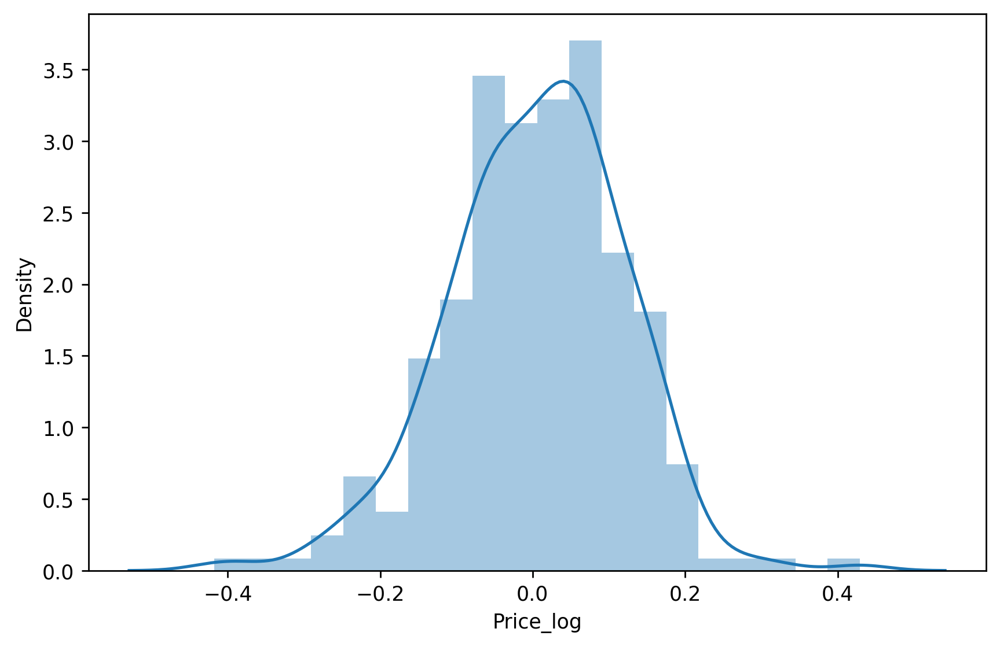

In [79]:
test_score = (y1_test - y1_pred)
sns.distplot(test_score)

In [80]:
lg.score(x1_test,y1_test)

0.8330918457330134

In [81]:
df_pf1 = pd.DataFrame()
df_pf1['Original_values'] = np.exp(y1_test)       # as we transformed the price with log, using exp reversed it back to original
df_pf1['Predictions'] = np.exp(y1_pred)
df_pf1['Difference'] = df_pf1['Original_values'] - df_pf1['Predictions']
df_pf1.head(10)

,Original_values,Predictions,Difference
753,9950.0,9840.867633,109.132367
858,7995.0,9895.354497,-1900.354497
630,7500.0,8772.306799,-1272.306799
1412,9950.0,9225.553890,724.446110
975,8950.0,8638.795948,311.204052
800,8995.0,8567.564825,427.435175
1030,9450.0,8418.083428,1031.916572
1372,6750.0,8367.426906,-1617.426906
260,11950.0,11368.168233,581.831767
317,10950.0,12057.276539,-1107.276539


In [82]:
df_pf1.shape

(287, 3)

In [83]:
df_pf1[df_pf1['Predictions'] > df_pf1['Original_values']].shape

(132, 3)

###  Residual Analysis

#### 1.Normality Test

In [84]:
import statsmodels.api as sm

train_resid = y1_train - y1_hat          # train_resid is variable for error based on training data
test_resid = y1_test - y1_pred           # test_resid is variable for error based on testing data

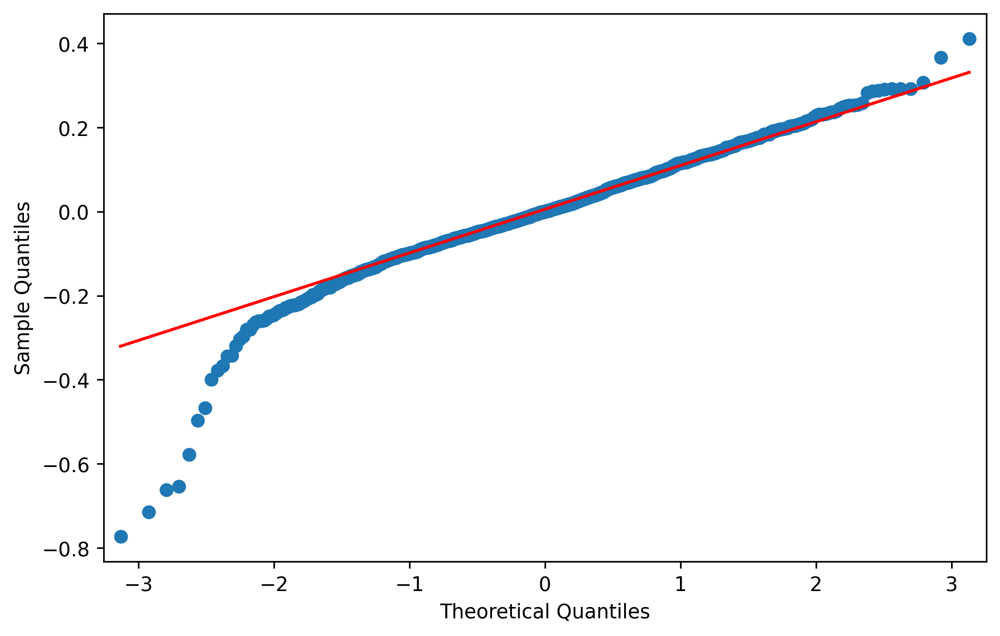

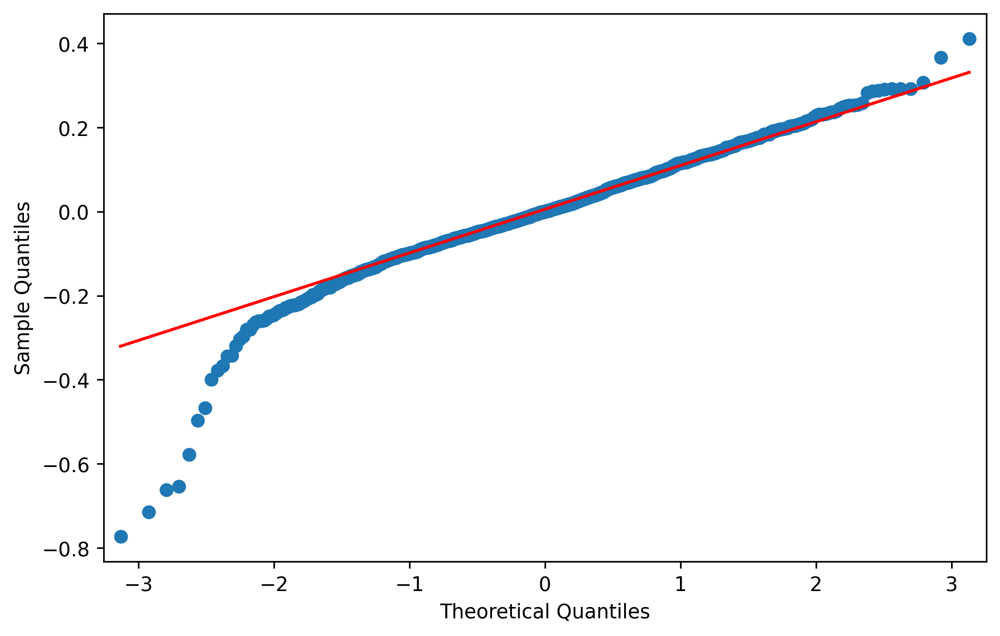

In [85]:
sm.qqplot(train_resid,line='q')

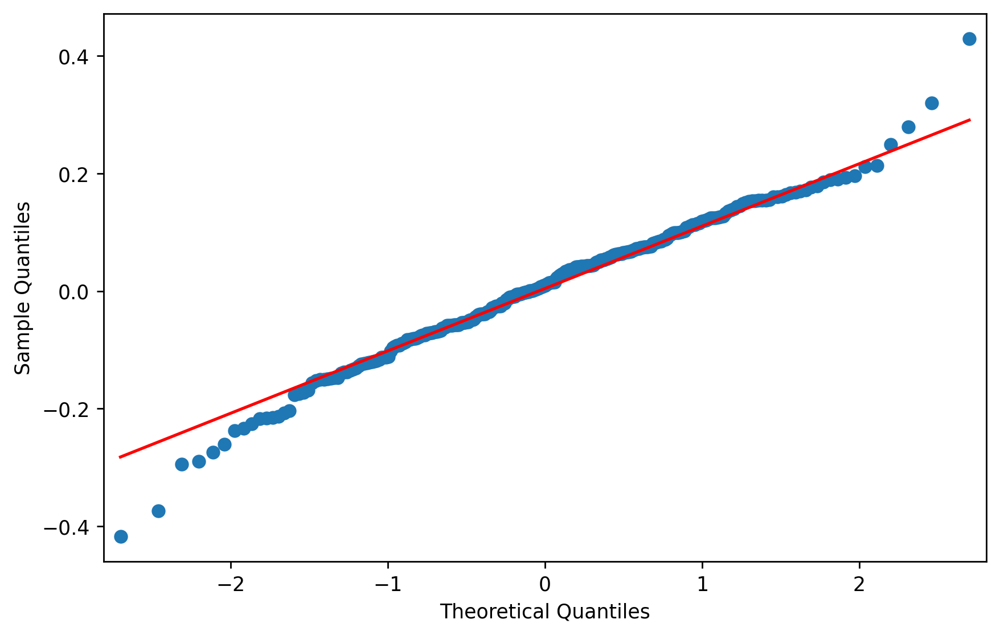

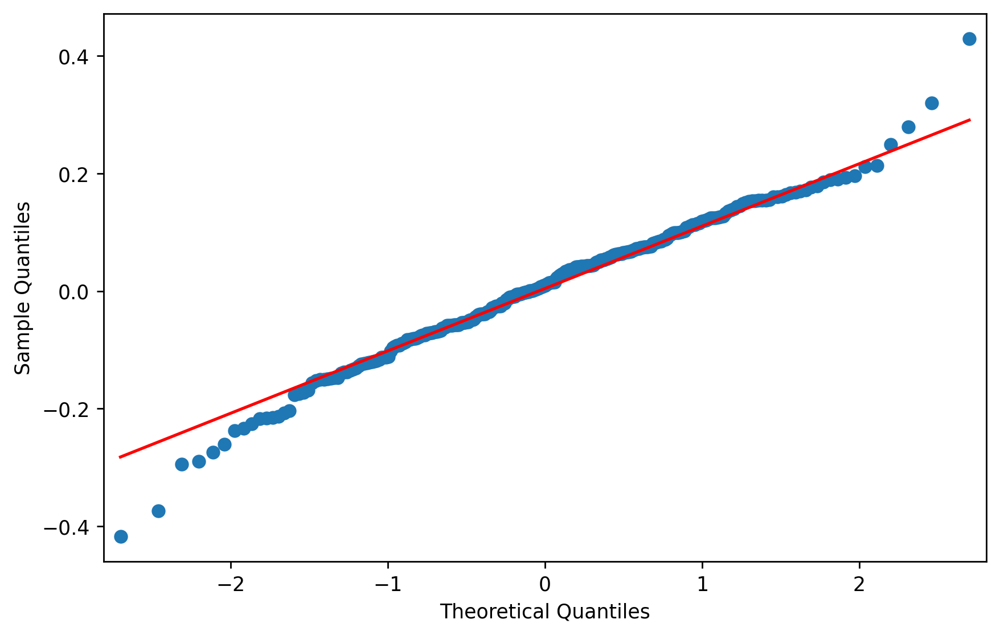

In [86]:
sm.qqplot(test_resid,line='q')

#### 2.Residual Plot of Homoscedasticity

Text(0, 0.5, 'Predicted Values')

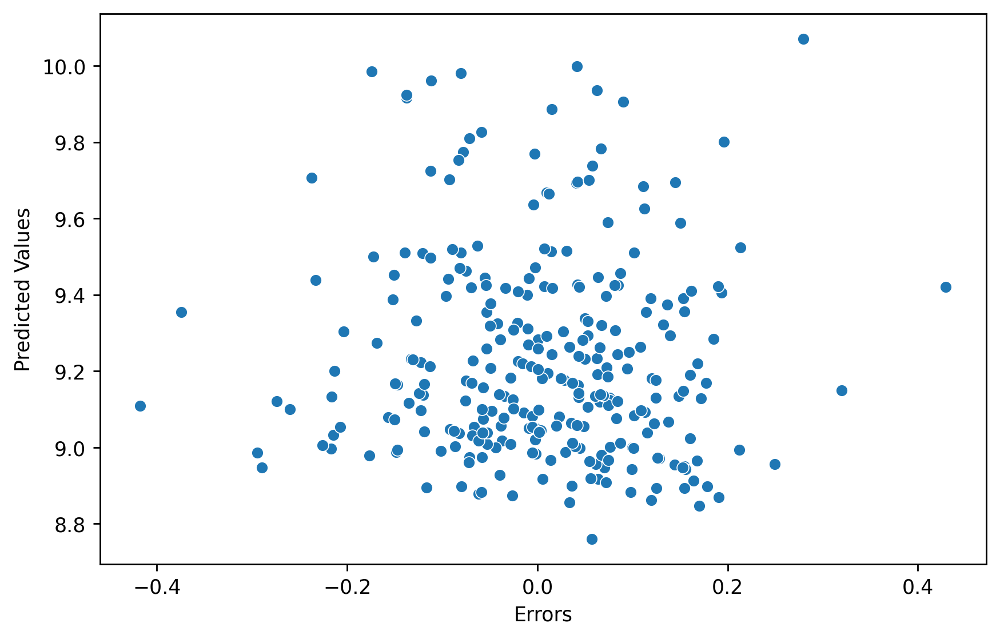

In [87]:
sns.scatterplot(x = test_resid,y = y1_pred)
plt.xlabel('Errors')
plt.ylabel('Predicted Values')

In [88]:
# No Pattern can be seen in scatterplot, thus we can say model is performing good.
# Both variables are independent of each other

### Model No.2

In [89]:
# In this model we will check for multicollinearity and try to improve our data.

In [90]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = data[['Age','HP_log','KM_sqrt','cc','Doors','Weight']]
vif = pd.DataFrame()
vif['features'] = variables.columns
vif['VIF'] = [variance_inflation_factor(variables.values, i) for i in range(len(variables.columns))]

In [91]:
vif

,features,VIF
0,Age,19.087090
1,HP_log,626.808980
2,KM_sqrt,24.552385
3,cc,161.572456
4,Doors,21.424608
5,Weight,975.915764


In [92]:
# Weight seems to have high VIF value, so we will drop this column in our model

In [93]:
x2 = data.drop(columns=['Price_log','Fuel_Type','Weight'])    
y2 = data['Price_log']
x2

,Age,KM_sqrt,HP_log,cc,Doors
0,23,216.762543,4.499810,1900,3
1,23,270.068510,4.499810,1900,3
2,24,204.232710,4.499810,1900,3
3,26,219.089023,4.499810,1900,3
4,30,196.214169,4.499810,1900,3
...,...,...,...,...,...
1431,69,143.331783,4.454347,1300,3
1432,72,137.840488,4.454347,1300,3
1433,71,130.445391,4.454347,1300,3
1434,70,130.061524,4.454347,1300,3


In [94]:
# Standardization of x2 dataset
scaler.fit(x2)
scaler_inputs2 = scaler.transform(x2)

In [95]:
x2_train, x2_test, y2_train, y2_test = train_test_split(x2, y2, test_size=0.2, random_state=42)

In [96]:
lg.fit(x2_train,y2_train)

LinearRegression()

#### Train Data Prediction

In [97]:
y2_hat = lg.predict(x2_train)

In [98]:
pe.scatter(x= y2_hat, y = y2_train)

<Axes: xlabel='Price_log', ylabel='Density'>

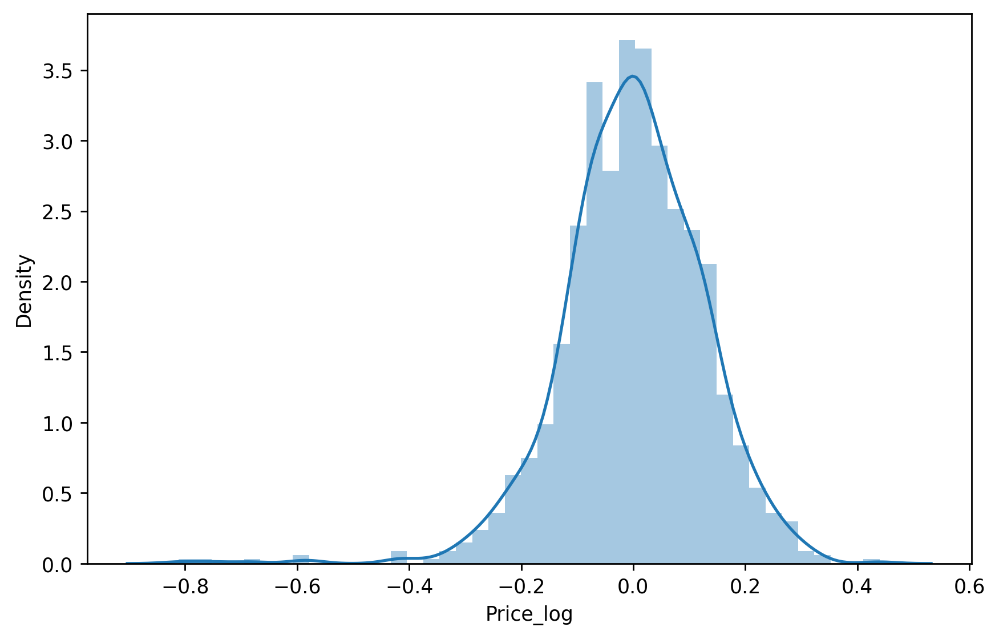

In [99]:
sns.distplot(y2_train - y2_hat)

In [100]:
lg.score(x2_train,y2_train)

0.8229491860138493

#### Test Data Prediction

In [101]:
y2_pred = lg.predict(x2_test)

In [102]:
pe.scatter(x = y2_pred, y = y2_test)

<Axes: xlabel='Price_log', ylabel='Density'>

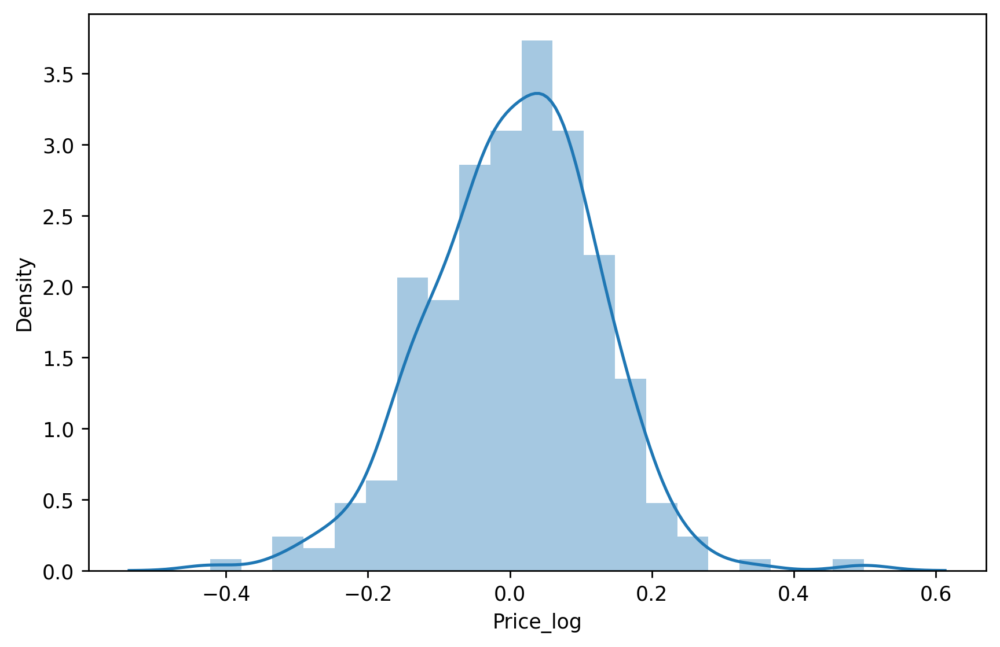

In [103]:
sns.distplot(y2_test - y2_pred)

In [104]:
lg.score(x2_test,y2_test)

0.8253969584941003

### Residual Analysis

#### Normality test

In [105]:
test_resid2 = y2_test - y2_pred

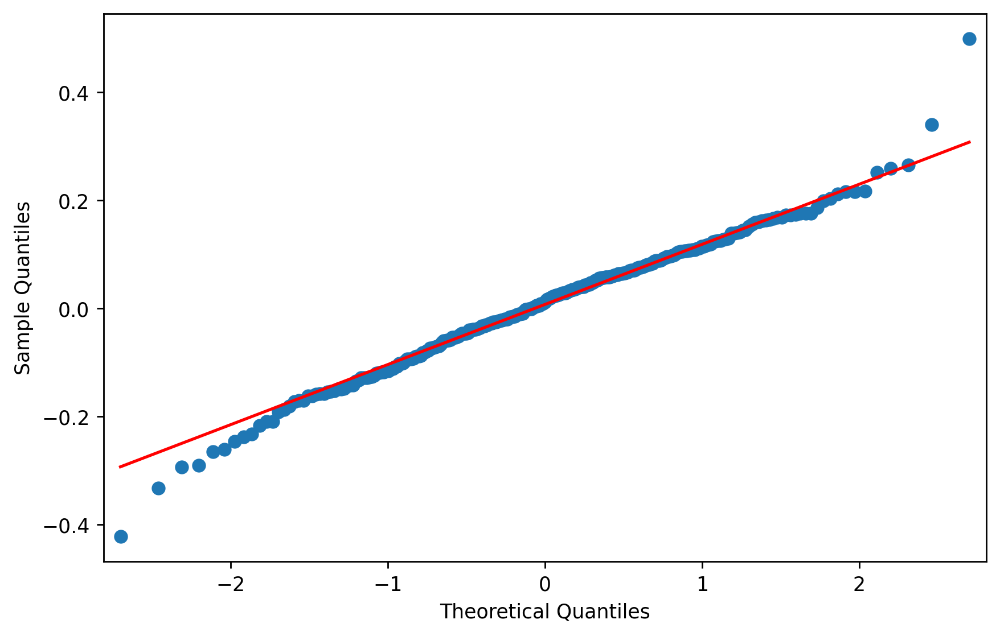

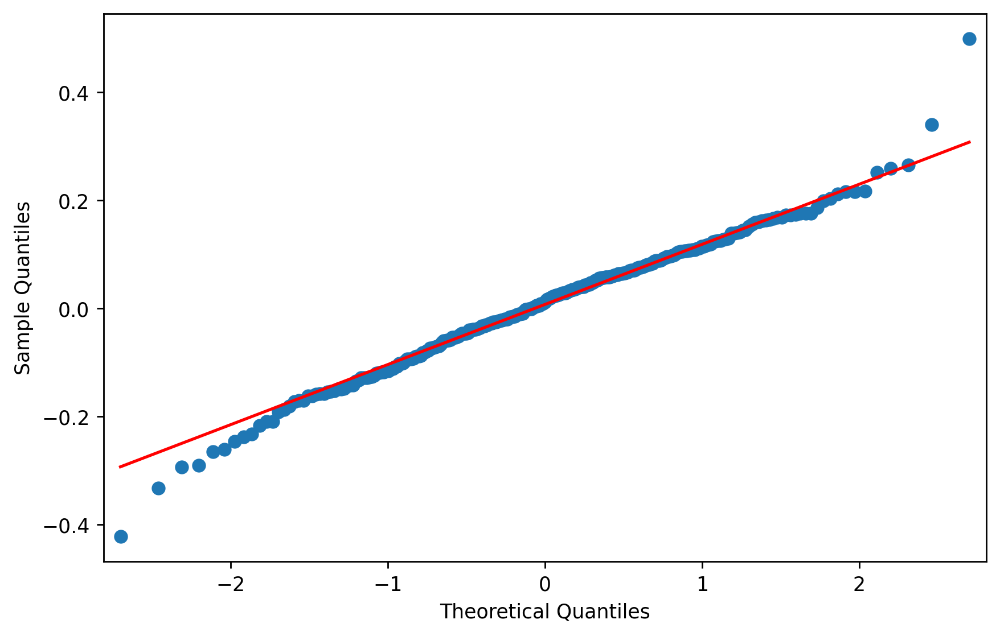

In [106]:
sm.qqplot(test_resid2,line='q')

#### Residual plot of Homoscedasticity

Text(0, 0.5, 'Predicted Values')

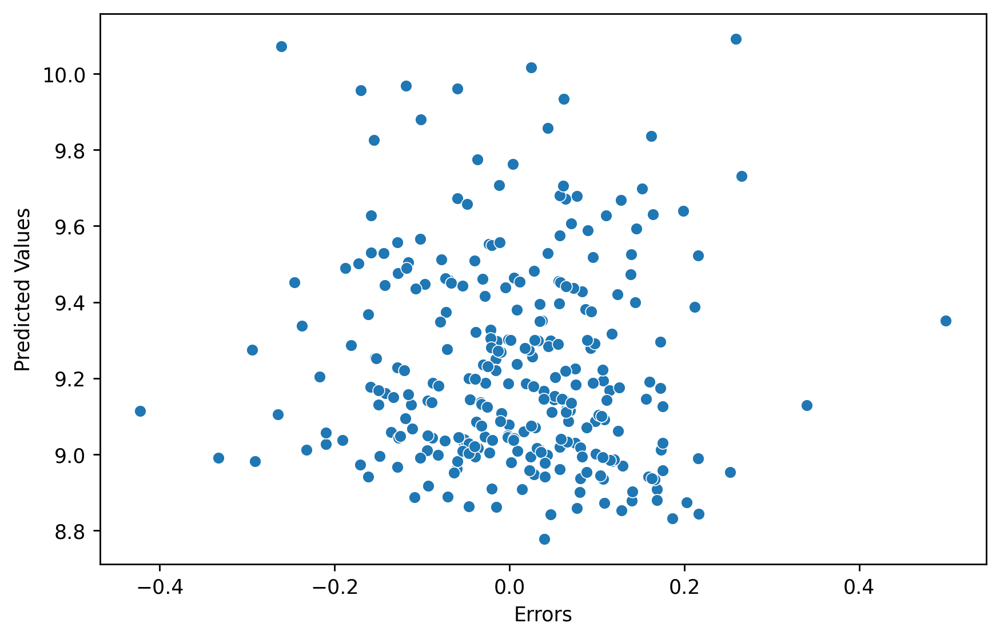

In [107]:
sns.scatterplot(x = test_resid2, y = y2_pred)
plt.xlabel('Errors')
plt.ylabel('Predicted Values')

In [108]:
# Error values and predicted values are independent of each other
# But having weight column in dataset improves accuracy of our model.

### Model No.3

In [109]:
# In third model we will include Fuel_Type variable and see what effect it has on our model

In [110]:
data = pd.get_dummies(data, columns=['Fuel_Type'], drop_first=True)
data

,Price_log,Age,KM_sqrt,HP_log,cc,Doors,Weight,Fuel_Type_Diesel,Fuel_Type_Petrol
0,9.510445,23,216.762543,4.499810,1900,3,1152.5,1,0
1,9.528794,23,270.068510,4.499810,1900,3,1152.5,1,0
2,9.543235,24,204.232710,4.499810,1900,3,1152.5,1,0
3,9.612467,26,219.089023,4.499810,1900,3,1152.5,1,0
4,9.528794,30,196.214169,4.499810,1900,3,1152.5,1,0
...,...,...,...,...,...,...,...,...,...
1431,8.922658,69,143.331783,4.454347,1300,3,1025.0,0,1
1432,9.291459,72,137.840488,4.454347,1300,3,1015.0,0,1
1433,9.047821,71,130.445391,4.454347,1300,3,1015.0,0,1
1434,8.888757,70,130.061524,4.454347,1300,3,1015.0,0,1


In [111]:
data.rename(columns={'Fuel_Type_Diesel':'Diesel','Fuel_Type_Petrol':'Petrol'},inplace=True)

In [112]:
data

,Price_log,Age,KM_sqrt,HP_log,cc,Doors,Weight,Diesel,Petrol
0,9.510445,23,216.762543,4.499810,1900,3,1152.5,1,0
1,9.528794,23,270.068510,4.499810,1900,3,1152.5,1,0
2,9.543235,24,204.232710,4.499810,1900,3,1152.5,1,0
3,9.612467,26,219.089023,4.499810,1900,3,1152.5,1,0
4,9.528794,30,196.214169,4.499810,1900,3,1152.5,1,0
...,...,...,...,...,...,...,...,...,...
1431,8.922658,69,143.331783,4.454347,1300,3,1025.0,0,1
1432,9.291459,72,137.840488,4.454347,1300,3,1015.0,0,1
1433,9.047821,71,130.445391,4.454347,1300,3,1015.0,0,1
1434,8.888757,70,130.061524,4.454347,1300,3,1015.0,0,1


In [113]:
data['Petrol'].sum()           # Majority of cars in dataset are petrol cars

1264

<Axes: >

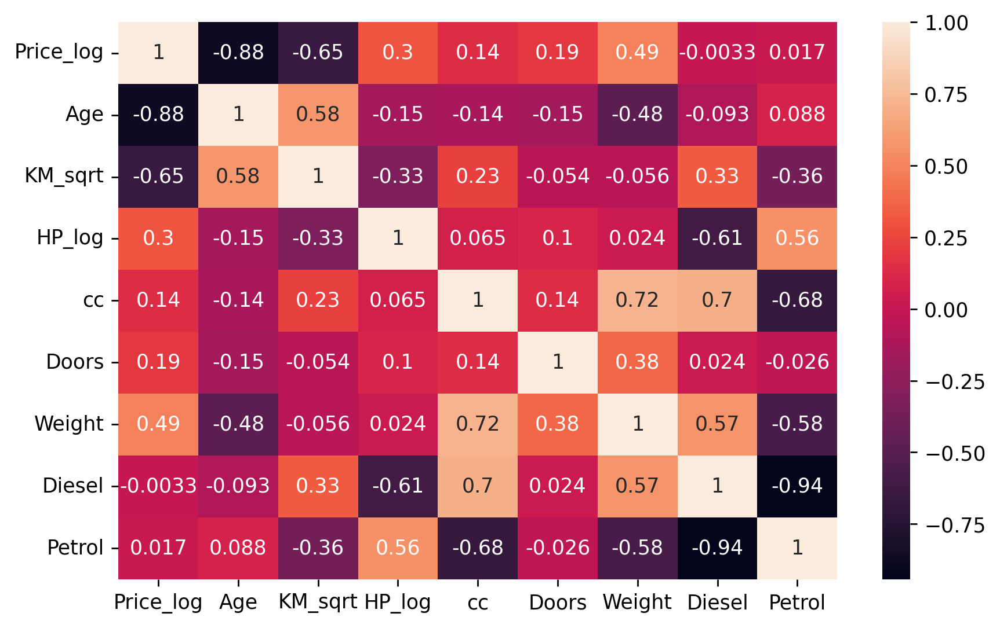

In [114]:
sns.heatmap(data.corr(),annot=True)

In [115]:
x3 = data.drop(columns=['Price_log'])
y3 = data['Price_log']
x3

,Age,KM_sqrt,HP_log,cc,Doors,Weight,Diesel,Petrol
0,23,216.762543,4.499810,1900,3,1152.5,1,0
1,23,270.068510,4.499810,1900,3,1152.5,1,0
2,24,204.232710,4.499810,1900,3,1152.5,1,0
3,26,219.089023,4.499810,1900,3,1152.5,1,0
4,30,196.214169,4.499810,1900,3,1152.5,1,0
...,...,...,...,...,...,...,...,...
1431,69,143.331783,4.454347,1300,3,1025.0,0,1
1432,72,137.840488,4.454347,1300,3,1015.0,0,1
1433,71,130.445391,4.454347,1300,3,1015.0,0,1
1434,70,130.061524,4.454347,1300,3,1015.0,0,1


In [116]:
scaler.fit(x3)
scaler_inputs2 = scaler.transform(x3)

In [117]:
x3_train, x3_test, y3_train, y3_test = train_test_split(x3, y3, test_size=0.2, random_state=42)

In [118]:
lg.fit(x3_train,y3_train)

LinearRegression()

#### Train Data Prediction

In [119]:
y3_hat = lg.predict(x3_train)

In [120]:
pe.scatter(x = y3_hat, y = y3_train)

Text(0, 0.5, 'Predicted Values')

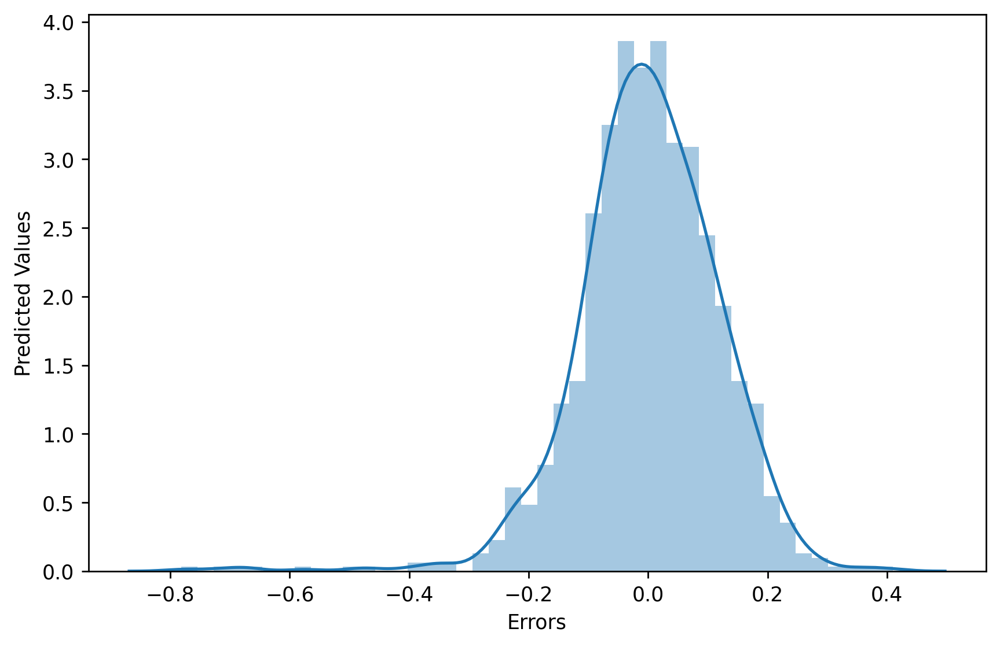

In [121]:
sns.distplot(y3_train - y3_hat)
plt.xlabel('Errors')
plt.ylabel('Predicted Values')

In [122]:
lg.score(x3_train,y3_train)

0.8409779648134978

#### Test Data Prediction

In [123]:
y3_pred = lg.predict(x3_test)

In [124]:
pe.scatter(x = y3_pred, y = y3_test)

Text(0, 0.5, 'Predicted Values')

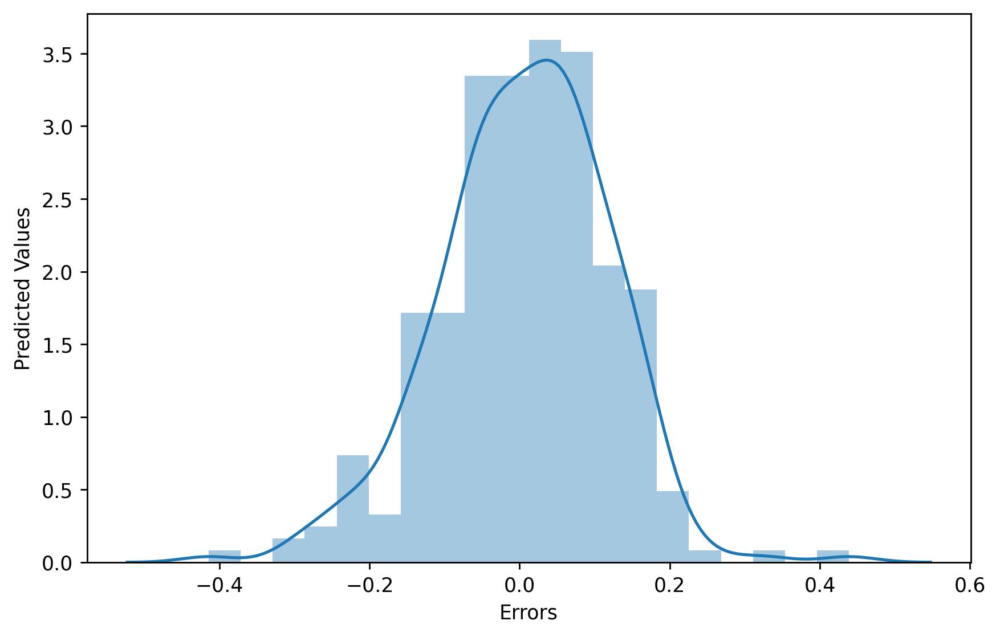

In [125]:
sns.distplot(y3_test - y3_pred)
plt.xlabel('Errors')
plt.ylabel('Predicted Values')

In [126]:
lg.score(x3_test, y3_test)

0.842229101696338

In [127]:
# Model Score has increased after including fuel_type variable.

### Residual Analysis

#### Normality Test

In [128]:
test_resid3 = y3_test - y3_pred

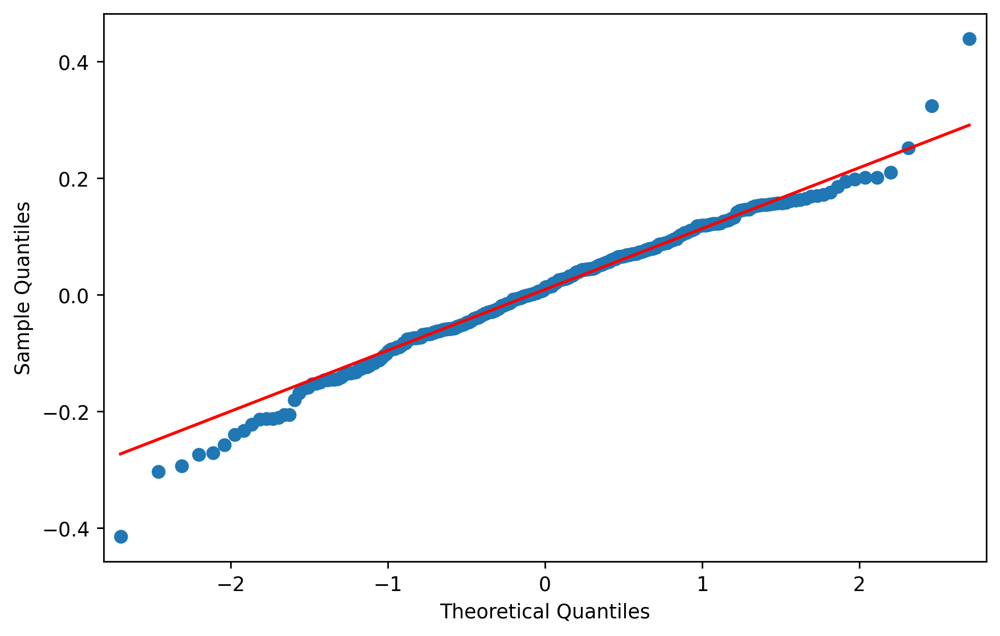

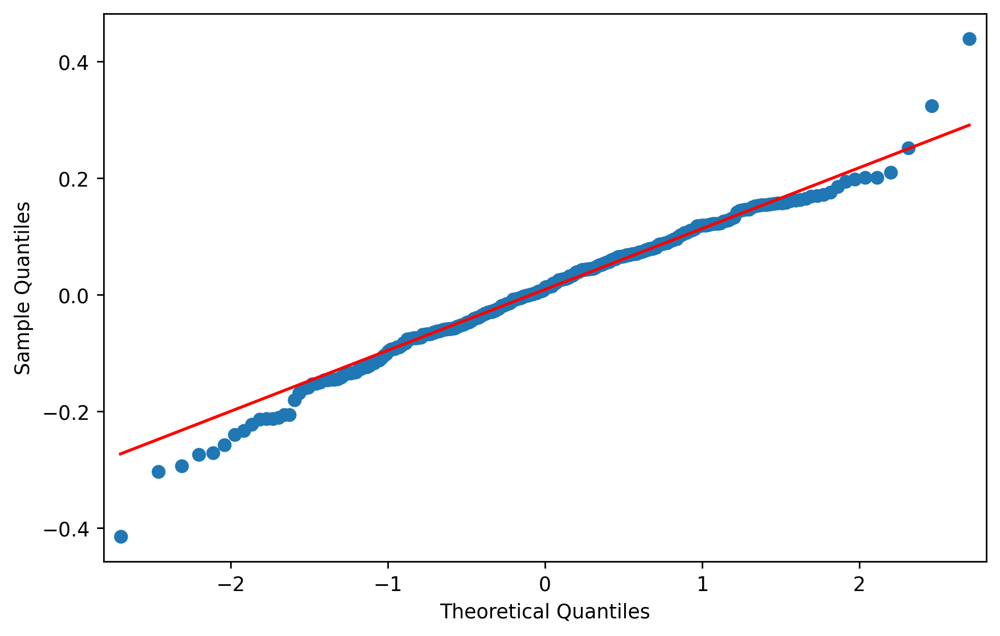

In [129]:
sm.qqplot(test_resid3,line='q')

#### Residual plot of Homoscedasticity

Text(0, 0.5, 'Predicted Values')

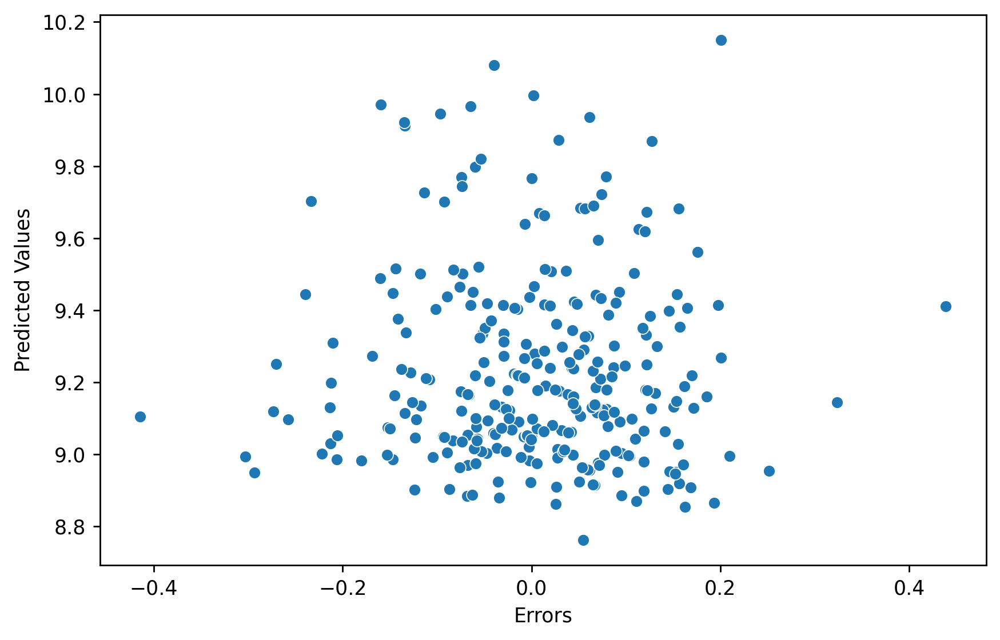

In [130]:
sns.scatterplot(x = test_resid3, y = y3_pred)
plt.xlabel('Errors')
plt.ylabel('Predicted Values')

In [131]:
# Error values and predicted values are independent of each other.
# Since we don't find any pattern in our model, we won't need to run model deletion diagnostics.


In [132]:
test_data = pd.DataFrame({'Age':[10,13,17,6,22],'KM_sqrt':[117.247,200,262,198,282],'HP_log':[4.574,4.489,4.499,4.56,4.12],
                          'cc':[1400,1900,1300,1500,1700],'Doors':[5,4,4,4,4],'Weight':[1110,1200,1100,1250,1270],
                          'Diesel':[0,0,0,1,1],'Petrol':[1,1,1,0,0]})

In [133]:
test_data

,Age,KM_sqrt,HP_log,cc,Doors,Weight,Diesel,Petrol
0,10,117.247,4.574,1400,5,1110,0,1
1,13,200.000,4.489,1900,4,1200,0,1
2,17,262.000,4.499,1300,4,1100,0,1
3,6,198.000,4.560,1500,4,1250,1,0
4,22,282.000,4.120,1700,4,1270,1,0


In [134]:
pred_price = lg.predict(test_data)

In [135]:
test_data['final_price'] = np.exp(pred_price)

In [136]:
test_data

,Age,KM_sqrt,HP_log,cc,Doors,Weight,Diesel,Petrol,final_price
0,10,117.247,4.574,1400,5,1110,0,1,19754.668865
1,13,200.000,4.489,1900,4,1200,0,1,17074.574515
2,17,262.000,4.499,1300,4,1100,0,1,16043.154136
3,6,198.000,4.560,1500,4,1250,1,0,27457.730800
4,22,282.000,4.120,1700,4,1270,1,0,16867.865654
